Inspect the data inside the training data hdf5 file.

The goal is to cluster shower subclusters together.

To make the file that goes into this notebook run `run_lardata2hdf5.py` in the `dataprep` folder.

Example command:

```
python3 deploy_larmatchme.py --config-file config_larmatchme.yaml --weights checkpoint.wise-capybara-107.101000.tar -p 0.3 --input-larcv [dlmerged_file] --input-larlite [dlmerged_file] -savelm -saveptmc -trueedges -o test.h5 -d cpu
```

In [1]:
import os,sys
#print(sys.path)
import plotly.graph_objects as go
from ctypes import c_int
import numpy as np
%load_ext autoreload  
%autoreload 2

In [2]:
# data useful for plots
import lardly
from lardly import DetectorOutline # load utility to draw TPC outline
detdata = DetectorOutline()
detlines = detdata.getlines(color=(10,10,10))

# PARTICLE LABEL COLORS
ssnetcolor = {-1:np.array((0,0,0)),     # ghost                                                                                                                                                   
              0:np.array((255,0,0)),   # electron                                                                                                                                       
              1:np.array((0,255,0)),   # gamma                                                                                                                             
              2:np.array((0,0,255)),   # muon                                                                                                                                              
              3:np.array((255,0,255)), # proton                                                                                                                                                 
              4:np.array((0,255,255)) # pion (+other mesons)
             }


ssnetnames = {-1:"ghost",
             0:"e",
             1:"gamma",
             2:"mu",
             3:"proton",
             4:"pion"}

kpcolors = {0:np.array((255,0,0)), # nu (red)
            1:np.array((0,255,0)), # track-start (green)
            2:np.array((0,0,255)), # track-end (blue)
            3:np.array((255,128,0)), # shower (orange)
            4:np.array((0,255,255)), # michel
            5:np.array((255,0,255))} # delta
kpnames = {0:"neutrino",
          1:"track-start",
          2:"track-end",
          3:"shower-start",
          4:"michel-start",
          5:"delta-start"}

# define default axes and layout of plot
axis_template = {
        "showbackground": True,
        "backgroundcolor": "rgb(255,255,255)",
        "gridcolor": "rgb(175, 175, 175)",
        "zerolinecolor": "rgb(175, 175, 175)"
    }

plot3d_layout = {
    "title": "Detector View",
    "height":800,
    "margin": {"t": 0, "b": 0, "l": 0, "r": 0},
    "font": {"size": 12, "color": "black"},
    "showlegend": False,
    "paper_bgcolor": "rgb(255,255,255)",
    "scene": {
        "xaxis": axis_template,
        "yaxis": axis_template,
        "zaxis": axis_template,
        "aspectratio": {"x": 1, "y": 1, "z": 4},
        "camera": {"eye": {"x": -4.0, "y": 0.25, "z": 0.0},
            "center":{"x":0.0, "y":0.0, "z":0.0},
            "up":dict(x=0, y=1, z=0)},
        "annotations": [],
    },
}


In [3]:
import os
inputfiles = ["test.h5"]
#inputfiles = ['../showerdata_mcc9_v40a_dl_run3b_NC_pi0_overlay_CV_000f0010-c197-47cf-bf02-7470b8e7cde5.h5']
print(os.path.exists(inputfiles[0]))

True


In [4]:
import torch
from dlshowermodel.data.larmatchhit_hdf5_reader import LArMatchHitHDF5Dataset

MAX_NUM_SPACEPOINTS=50000
APPLY_MAX_FILTER=True
dataset = LArMatchHitHDF5Dataset(file_paths=inputfiles, 
                            file_has_training_labels=True,
                            file_has_larmatch_inputs=True,
                            file_has_mctruth_labels=True,
                            max_num_spacepoints=MAX_NUM_SPACEPOINTS,
                            apply_max_filter=APPLY_MAX_FILTER)

Make entry table for list of files (len= 1 )
MAKE_ENTRY_TABLE: Loading from list of file paths
nkeys= 22 //ncols= 22  length= 1  for  test.h5


In [5]:
# utility functions for making plots

# function to make plotly line plots in order to draw edges
def make_plotly_edge_plots( graph ):
    xseg_false = []
    yseg_false = []
    zseg_false = []
    xseg_true = []
    yseg_true = []
    zseg_true = []
    for iedge in range( graph.edge_index.shape[1] ):
        ie0 = graph.edge_index[0,iedge]
        ie1 = graph.edge_index[1,iedge]
        if ie0>=ie1:
            continue
        pos0 = graph.pos[ie0]
        pos1 = graph.pos[ie1]
        label = graph.edge_label[iedge]
        xseg = []
        yseg = []
        zseg = []
        xseg.append( pos0[0] )
        xseg.append( pos1[0] )
        xseg.append( None )
        yseg.append( pos0[1] )
        yseg.append( pos1[1] )
        yseg.append( None )
        zseg.append( pos0[2] )
        zseg.append( pos1[2] )
        zseg.append( None )

        if label==1.0:
            xseg_true += xseg
            yseg_true += yseg
            zseg_true += zseg
        else:
            xseg_false += xseg
            yseg_false += yseg
            zseg_false += zseg
    plot_trueedges = {
        "type":"scatter3d",
        "mode":"lines",
        "x":xseg_true,
        "y":yseg_true,
        "z":zseg_true,
        "line":{"color":"red","width":3.0},
        "name":"true"}
    plot_falseedges = {
        "type":"scatter3d",
        "mode":"lines",
        "x":xseg_false,
        "y":yseg_false,
        "z":zseg_false,
        "line":{"color":"black","width":0.5},
        "name":"false"}
    return [plot_trueedges,plot_falseedges]

# Run this cell to slice out instance cluster arrays
def get_instanceid_clusters( points, labels, verbose=False, min_size=-1, skip_id_list=[-1] ):
    """
    points : (3,N) numpy array with (x,y,z) position of spacepoints
    labels:  (1,N) numpy array with instance ID label for spacepoints
    """
    idlist = np.unique(labels)
    #print(idlist)
    #print(points.shape)
    clusterdict = {}
    for iid in idlist:
        if iid in skip_id_list:
            continue
        cfilter = labels==iid
        #print(cfilter.shape)
        cluster_pos = points[cfilter,:]
        if cluster_pos.shape[-1]<min_size:
            continue
        if verbose:
            print("cluster id=",iid," size=",cluster_pos.shape[1])
        clusterdict[iid] = cluster_pos
    return clusterdict

def make_graph_cluster_plots( graph ):
    # make cluster plots
    import plotly.express as px

    cid_pts = get_instanceid_clusters( graph.cluster_points, graph.cluster_labels )
    
    nclusters = len(cid_pts)
    colors = px.colors.qualitative.Plotly[:nclusters]
    ncolors = len(colors)
    
    cluster_plots = []
    ii = 0
    for cid in cid_pts:
        # print("custom.shape: ",spacepoint_customdata.shape)
        #cid_pixsum = cluster_feat_planepixelsum[remap[cid],:]*0.0126
        cid_pixsum = graph.pixsum_features[cid,:]*0.0126
        cpos = cid_pts[cid]
    
        hovertemplate='x: %{x}<br>' + \
                'y: %{y}<br>' + \
                'z: %{z}<br>' + \
                'q: %.1f, %.1f, %.1f<br>'%(cid_pixsum[0],cid_pixsum[1],cid_pixsum[2]) + \
                'npts: %d'%(cpos.shape[0])
        cluster_plot = {
            "type":"scatter3d",
            "x": cpos[:,0],
            "y": cpos[:,1],
            "z": cpos[:,2],
            "mode":"markers",
            "name":"ID[%d]"%(cid),
            "hovertemplate":hovertemplate,
            "marker":{"color":colors[ii%ncolors],"size":2.0,"opacity":0.5}
        }
        cluster_plots.append(cluster_plot)
        ii += 1

    edge_plots = make_plotly_edge_plots(graph)

    return cluster_plots+edge_plots

def build_cluster_edge_lines( edge_list, cluster_feat_centroid, remap ):
    # build edges
    edge_plots = []
    for iedge in range( edge_list.shape[0] ):
        endpts = np.zeros((2,3))
        edge = edge_list[iedge,:] # pairs of cluster index
        if edge[0]==edge[1]:
            continue
        endpts[0,:] = cluster_feat_centroid[remap[edge[0]]]
        endpts[1,:] = cluster_feat_centroid[remap[edge[1]]]
        edge_plot = {
            "type":"scatter3d",
            "x":endpts[:,0],
            "y":endpts[:,1],
            "z":endpts[:,2],
            "mode":"lines",
            "name":"(%d,%d)"%(edge[0],edge[1]),
            "line":{"color":"rgba(255,0,0,1)","width":3.0}
        }
        edge_plots.append(edge_plot)
    return edge_plots

In [6]:
from torch.utils.data import DataLoader
BATCH_SIZE=1
SHUFFLE=False
NUM_WORKERS=1
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=SHUFFLE, num_workers=NUM_WORKERS, collate_fn=LArMatchHitHDF5Dataset.collate_fn)

In [7]:
dataiter = iter(dataloader)

In [8]:
# Get data
batchdata = [dataset[0]]

In [9]:
print(batchdata[0].keys())

dict_keys(['shower_points', 'cluster_labels', 'cluster_sampled_pos', 'cluster_sampled_feat', 'cluster_feat_planepixelsum', 'cluster_feat_centroid', 'cluster_feat_pca', 'cluster_index_remap', 'showercluster_edge_list', 'lmfeatures', 'lmscores', 'ssnet', 'paf', 'kpscores', 'pos', 'pixvals', 'lmshower_selection_mask', 'instanceids', 'particleids', 'keyptlabels', 'keypoint_data', 'origin', 'idx', 'npts'])


pos.shape:  (32657, 3)
cluster_labels.shape:  (32657,)
cluster_sampled_pos:  (115, 16, 3)
edge list.shape:  (9, 2)
cluster labels: 
[ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114]
number of reco clusters (above min_size):  115


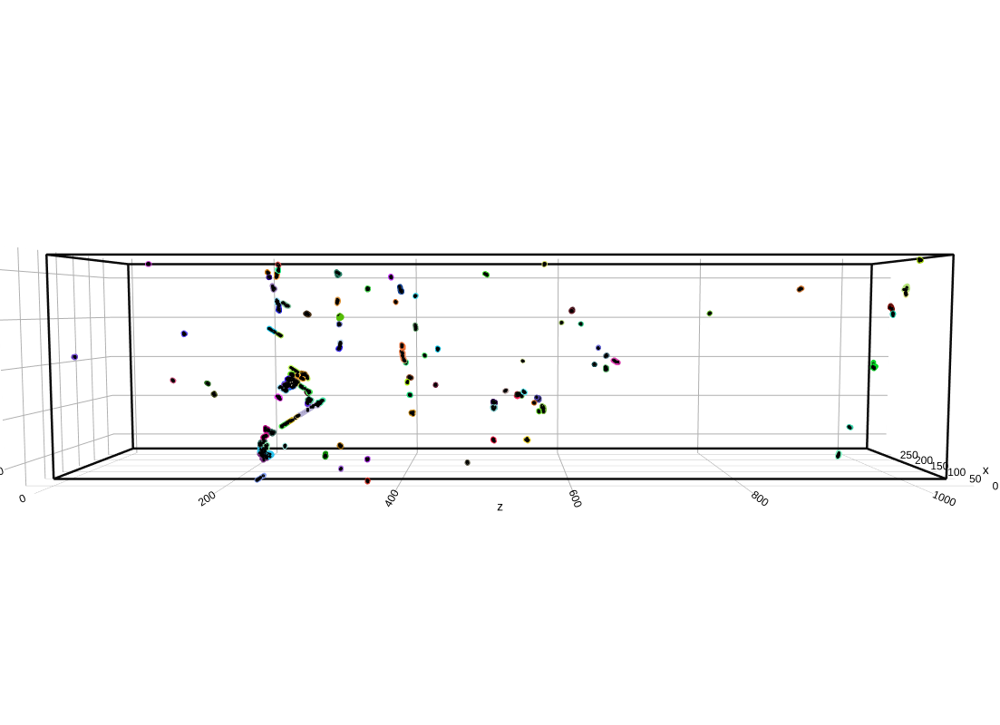

In [10]:
# Plot the clusters and truth edges (if exists)

DRAW_TRUTH_EDGES=False
spacepoint_size = 3.0

xpos  = batchdata[0]['shower_points']
cluster_labels = np.squeeze( batchdata[0]['cluster_labels'] )

print("pos.shape: ",xpos.shape)
print("cluster_labels.shape: ",cluster_labels.shape)

cluster_sampled_pos  = batchdata[0]['cluster_sampled_pos']
cluster_sampled_feat = batchdata[0]['cluster_sampled_feat']
cluster_index_remap = np.squeeze( batchdata[0]['cluster_index_remap'] )
cluster_feat_centroid = batchdata[0]['cluster_feat_centroid']
cluster_feat_planepixelsum = np.squeeze(batchdata[0]['cluster_feat_planepixelsum'])
cluster_feat_pca = np.squeeze(batchdata[0]['cluster_feat_pca'])
edge_list = np.squeeze(batchdata[0]['showercluster_edge_list'])

remap = {}
# for idx,cid in enumerate(cluster_index_remap):
#     #remap[cid] = idx
#     remap[cid] = cid
for i in range(cluster_feat_centroid.shape[0]):
    remap[i] = i

print("cluster_sampled_pos: ",cluster_sampled_pos.shape)
#print("edge list: ",edge_list)
print("edge list.shape: ",edge_list.shape)

print("cluster labels: ")
print(np.unique(cluster_labels))

reco_clusters = get_instanceid_clusters( xpos,
                                        cluster_labels,
                                        min_size=1,
                                        verbose=False)

nclusters = len(reco_clusters)
print("number of reco clusters (above min_size): ",nclusters)
#print(reco_clusters.keys())

#import plotly.express as px

#colors = px.colors.qualitative.Plotly[:nclusters]
#ncolors = len(colors)

reco_cluster_plots = []
sampled_points_v = []
ii = 0
cid_color = {}
for cid in reco_clusters:

    #if cid not in [0,3,6]:
    #    continue
    
    cpos = reco_clusters[cid]
    
    # print("custom.shape: ",spacepoint_customdata.shape)
    #cid_pixsum = cluster_feat_planepixelsum[remap[cid],:]*0.0126
    cid_pixsum = cluster_feat_planepixelsum[cid,:]*0.0126
    
    hovertemplate='x: %{x}<br>' + \
                'y: %{y}<br>' + \
                'z: %{z}<br>' + \
                'q: %.1f, %.1f, %.1f<br>'%(cid_pixsum[0],cid_pixsum[1],cid_pixsum[2]) + \
                'npts: %d'%(cpos.shape[0])
    rcolor = np.random.randint(0,255,3)
    scolor = f"rgba({rcolor[0]},{rcolor[1]},{rcolor[2]},1)"
    cluster_plot = {
        "type":"scatter3d",
        "x": cpos[:,0],
        "y": cpos[:,1],
        "z": cpos[:,2],
        "mode":"markers",
        "name":"ID[%d]"%(cid),
        "hovertemplate":hovertemplate,
        "marker":{"color":scolor,"size":spacepoint_size,"opacity":0.5}
    }
    cid_color[cid] = scolor
    reco_cluster_plots.append(cluster_plot)

    # pca lines
    for ipca in range(3):
        centroid = cluster_feat_centroid[remap[cid]]
        pca_feats = cluster_feat_pca[remap[cid]]
        endpts = np.zeros((2,3))
        endpts[0,:] = centroid + pca_feats[3*ipca:3*ipca+3]*0.5*pca_feats[18+ipca]
        endpts[1,:] = centroid - pca_feats[3*ipca:3*ipca+3]*0.5*pca_feats[18+ipca]
        pca_plot = {
            "type":"scatter3d",
            "x": endpts[:,0],
            "y": endpts[:,1],
            "z": endpts[:,2],
            "mode":"lines",
            "name":"PC%d[%d]"%(ipca+1,cid),
            "hovertemplate":hovertemplate,
            "line":{"color":scolor,"width":2.0}
        }
        reco_cluster_plots.append(pca_plot)
          
    sampled_points_v.append( cluster_sampled_pos[remap[cid]] )
    ii += 1

# build edges
if DRAW_TRUTH_EDGES:
    for iedge in range( edge_list.shape[0] ):
        endpts = np.zeros((2,3))
        edge = edge_list[iedge,:] # pairs of cluster index
        if edge[0]==edge[1]:
            continue
        endpts[0,:] = cluster_feat_centroid[remap[edge[0]]]
        endpts[1,:] = cluster_feat_centroid[remap[edge[1]]]
        edge_plot = {
            "type":"scatter3d",
            "x":endpts[:,0],
            "y":endpts[:,1],
            "z":endpts[:,2],
            "mode":"lines",
            "name":"(%d,%d)"%(edge[0],edge[1]),
            "line":{"color":"rgba(255,0,0,1)","width":3.0}
        }
        reco_cluster_plots.append(edge_plot)

sampled_points = np.concatenate( sampled_points_v, axis=0 )
#print("sampled_points: ",sampled_points.shape)

# debug
#Nc, Ns, Nf = cluster_sampled_pos.shape
#sampled_points = cluster_sampled_pos.reshape( (Nc*Ns, Nf ) )

cluster_sampled_point_plot = {
        "type":"scatter3d",
        "x": sampled_points[:,0],
        "y": sampled_points[:,1],
        "z": sampled_points[:,2],
        "mode":"markers",
        "name":"Sampled",
        "marker":{"color":'rgba(0,0,0,1)',"size":2.0,"opacity":1.0}
    }
reco_cluster_plots.append( cluster_sampled_point_plot )

reco_cluster_traces = detlines + reco_cluster_plots

reco_cluster_layout = go.Layout(plot3d_layout)
reco_cluster_layout.title = "Reco Clusters"

reco_cluster_fig = go.Figure(data=reco_cluster_traces, layout=reco_cluster_layout)
reco_cluster_fig.show()


(247533, 3)
Number of clusters:  27


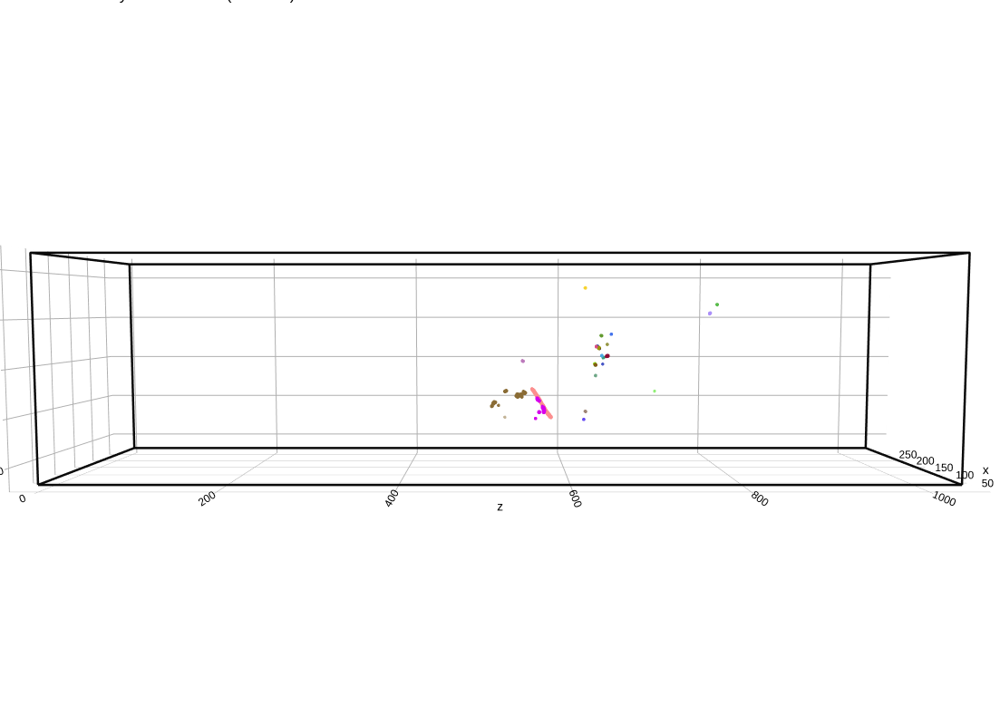

In [11]:
# Plot spacepoints colored by their true geant4 trackid
# tells us what spacepoints came from the same initial particle

xpos = np.transpose( batchdata[0]['pos'], (1,0) )
xlabels = np.squeeze(batchdata[0]['instanceids'])
print(xpos.shape)

instance_cluster_dict = get_instanceid_clusters( xpos, xlabels )
print("Number of clusters: ",len(instance_cluster_dict))
nclusters = len(instance_cluster_dict)

instance_cluster_plots = []
ii=0
for cid in instance_cluster_dict:
    if cid in [-1,0]:
        continue # skip the background cluster ID
    cpos = instance_cluster_dict[cid]

    rcolor = np.random.randint(0,255,3)
    scolor = f"rgba({rcolor[0]},{rcolor[1]},{rcolor[2]},1)"

    instance_cluster_plot = {
        "type":"scatter3d",
        "x": cpos[:,0],
        "y": cpos[:,1],
        "z": cpos[:,2],
        "mode":"markers",
        "name":"ID[%d]"%(cid),
        "marker":{"color":scolor,"size":2.0,"opacity":0.5}
    }
    ii += 1
    instance_cluster_plots.append( instance_cluster_plot )

instance_cluster_traces = detlines + instance_cluster_plots

instanceid_layout = go.Layout(plot3d_layout)
instanceid_layout.title = "Clusters by Truth Particle (Instance) ID"

instanceid_fig = go.Figure(data=instance_cluster_traces, layout=instanceid_layout)
instanceid_fig.show()

(6, 247533)
(247533,)
(247533, 3)
post-instanceid filter
(5986, 3)
(6, 5986)
shower kp
(5986,)


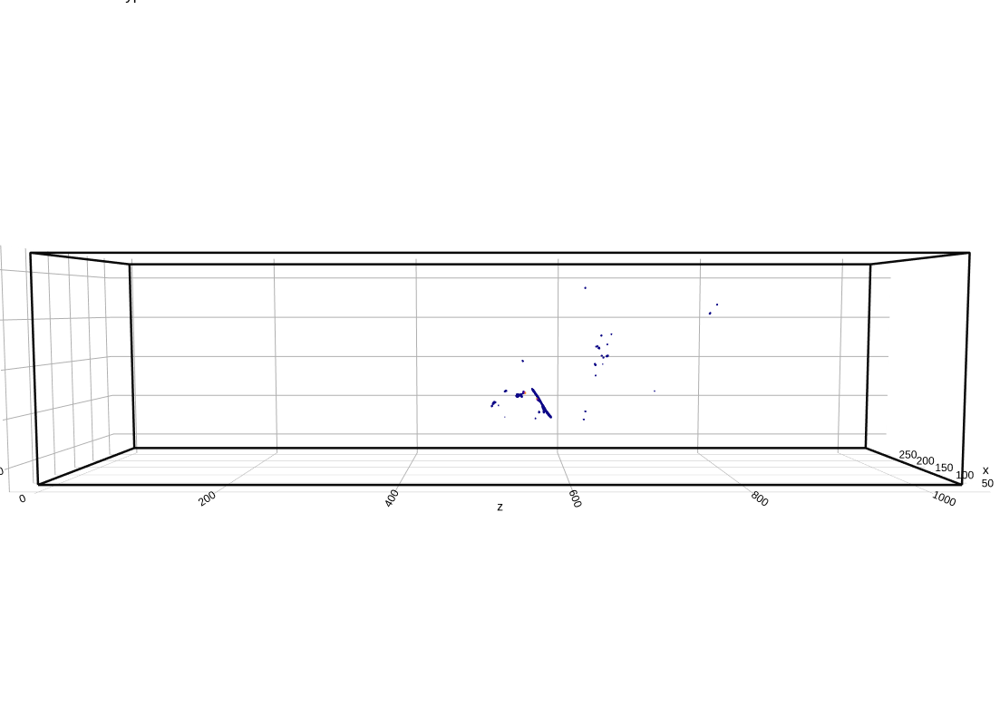

In [12]:
# keypoint plot

xpos = np.transpose( batchdata[0]['pos'], (1,0) )
xlabels = np.squeeze(batchdata[0]['instanceids'])
xkplabels = np.squeeze(batchdata[0]['keyptlabels'])

print(xkplabels.shape)
print(xlabels.shape)
print(xpos.shape)

xpos = xpos[ xlabels>0 ]
xkplabels = xkplabels[:, xlabels>0 ]

print("post-instanceid filter")
print(xpos.shape)
print(xkplabels.shape)

xshowerkp = np.sum( xkplabels[3:,:], axis=0 )
print("shower kp")
print(xshowerkp.shape)

showerkp_htext='x: %{x}<br>' + \
                'y: %{y}<br>' + \
                'z: %{z}<br>' + \
                'kp: %{customdata:.2f}'

showerkp_plot = {
    "type":"scatter3d",
    "x": xpos[:,0],
    "y": xpos[:,1],
    "z": xpos[:,2],
    "mode":"markers",
    "hovertext":showerkp_htext,
    "customdata":xshowerkp,
    "name":"showerkp",
    "marker":{"color":xshowerkp,"size":1.0,"opacity":0.5}
}

kpshower_traces = detlines + [showerkp_plot]
kpshower_layout = go.Layout(plot3d_layout)
kpshower_layout.title = "Shower Keypoint Labels"
kpshower_fig = go.Figure(data=kpshower_traces, layout=kpshower_layout)
kpshower_fig.show()

In [ ]:
# Plot true/ghost score
batchindex = 0

xpos = batchdata[batchindex]['pos']
lmscore = batchdata[batchindex]['lmscores']
print("xpos: ",xpos.shape)
print(lmscore)

# def make_callback_customdata(wireimgs,xtriplets):
#     xucol = wireimgs[0][xtriplets[:,0],1]
#     xurow = wireimgs[0][xtriplets[:,0],0]
#     xvcol = wireimgs[1][xtriplets[:,1],1]
#     xvrow = wireimgs[1][xtriplets[:,1],0]
#     xycol = wireimgs[2][xtriplets[:,2],1]
#     xyrow = wireimgs[2][xtriplets[:,2],0]
#     customdata = np.stack( (xucol,xurow,xvcol,xvrow,xycol,xyrow), axis=-1)
#     return customdata

# spacepoint_customdata = make_callback_customdata(wireimgs,xtriplets)

# print("custom.shape: ",spacepoint_customdata.shape)
# hovertemplate='<b>U</b>: (%{customdata[0]},%{customdata[1]})<br>' + \
#             '<b>V</b>: (%{customdata[2]},%{customdata[3]})<br>' + \
#             '<b>Y</b>: (%{customdata[4]},%{customdata[5]})<br>' + \
#             'x: %{x}<br>' + \
#             'y: %{y}<br>' + \
#             'z: %{z}<br>'

# define a 3d scatter plot in plotly
plot_spacepoints = {
    "type":"scatter3d",
    "x": xpos[0,:],
    "y": xpos[1,:],
    "z": xpos[2,:],
    "mode":"markers",
    "name":"spacepoints",
    #"customdata":spacepoint_customdata,
    #"hovertemplate":hovertemplate,
    "marker":{"color":lmscore[0,:],"size":1.0,"opacity":0.5,"colorscale":"Bluered","cmin":0.3,"cmax":1.0},
    }


# collect the things we want to plot
# we add the spacepoint plot to the outline of the uboone detector
spacepoint_plot_list = detlines + [plot_spacepoints]

# define axes and layout of plot
axis_template = {
    "showbackground": True,
    "backgroundcolor": "rgba(100, 100, 100,0.5)",
    "gridcolor": "rgb(50, 50, 50)",
    "zerolinecolor": "rgb(0, 0, 0)",
}

layout_spacepoint = go.Layout(plot3d_layout)
layout_spacepoint.title = "True/Ghost Scores"


# make the plot using plotly go
spacepoint_fig = go.Figure(data=spacepoint_plot_list, layout=layout_spacepoint)
spacepoint_fig.show()

In [ ]:
# PLOT SSNET: Shower scores DATA
# We add the electron+photon scores together
#import scipy

xpos = batchdata[0]['pos']
ssnet_logits = batchdata[0]['ssnet']

#ssnet_probs = scipy.special.softmax( ssnet_logits, axis=0 )
ssnet_logits = np.exp(ssnet_logits)
ssnet_z = np.sum( ssnet_logits, axis=0 )
print("ssnet_logits: ",ssnet_logits.shape)
print("ssnet_z: ",ssnet_z.shape)
ssnet_probs = ssnet_logits/np.expand_dims(ssnet_z,0)
print("ssnet_probs: ",ssnet_probs.shape)

shower_score = np.sum( ssnet_probs[:2,:], axis=0 ) # electron + photon scores
#shower2d_score = batchdata[0]['ssnet2d']
lmscore = batchdata[0]['lmscores'][0,:]

#score_to_plot = lmscore
score_to_plot = shower_score
#score_to_plot = shower2d_score[:,0]
print("shower score: ",score_to_plot.shape," min=",np.min(score_to_plot)," max=",np.max(score_to_plot))

lmshower_score = shower_score*lmscore
lms_max = np.max(lmshower_score)
if lms_max>0.0:
    lmshower_score /= lms_max
print("lms_max: ",np.max(lmshower_score))
print("lms_min: ",np.min(lmshower_score))

ssnet_plots = []

ssnet_hovertemplate = """
    x: %{x:.2f}<br>
    y: %{y:.2f}<br>
    z: %{z:.2f}<br>
    shower: %{customdata:.2f}
    """

ssnet_plot = {
    "type":"scatter3d",
    "x": xpos[0,:],
    "y": xpos[1,:],
    "z": xpos[2,:],
    "mode":"markers",
    "name":"lmshower",
    "hovertemplate":ssnet_hovertemplate,
    "customdata":score_to_plot,
    "marker":{"color":score_to_plot,"size":1.0,"opacity":0.5,"cmin":0.0,"cmax":1.0,"colorscale":"Bluered"}
}
ssnet_plots.append( ssnet_plot )

ssnet_plot_traces = detlines + ssnet_plots

layout = go.Layout(plot3d_layout)
layout.title = 'Shower score X LM score'

ssnet_fig = go.Figure(data=ssnet_plot_traces, layout=layout)
ssnet_fig.show()